In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch import optim
import torchvision
from torchvision import transforms as T
import torchvision.datasets as datasets
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt

In [2]:
class Discriminator(nn.Module):
    def __init__(self, img_dim):
        super(Discriminator, self).__init__()
        self.disc = nn.Sequential(
            nn.Linear(img_dim, 128),
            nn.LeakyReLU(0.1), 
            nn.Linear(128, 1),
            nn.Sigmoid()
        )
        
    def forward(self, x):
        return self.disc(x)

In [3]:
class Generator(nn.Module):
    def __init__(self, z_dim, img_dim):
        super(Generator, self).__init__()
        self.gen = nn.Sequential(
            nn.Linear(z_dim, 256), 
            nn.LeakyReLU(0.1),
            nn.Linear(256, img_dim),
            nn.Tanh()
        )
    
    def forward(self, x):
        return self.gen(x)

In [4]:
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
LEARNING_RATE = 3e-4
Z_DIM = 64
IMG_DIM = 784
BATCH_SIZE = 32
NUM_EPOCHS = 50

disc = Discriminator(IMG_DIM)
gen = Generator(Z_DIM, IMG_DIM)
fixed_noise = torch.randn((BATCH_SIZE, Z_DIM))

transforms = T.Compose([
    T.ToTensor(), 
    T.Normalize((0.5, ), (0.5, ))
])

dataset = datasets.MNIST(
    root='./dataset', 
    transform=transforms, 
    download=True
)
loader = DataLoader(dataset, batch_size=BATCH_SIZE, shuffle=True)

opt_disc = optim.Adam(disc.parameters(), lr=LEARNING_RATE)
opt_gen = optim.Adam(gen.parameters(), lr=LEARNING_RATE)
criterion = nn.BCELoss()

Epoch [1/50]:	loss_disc=1.3754	loss_gen=0.9011


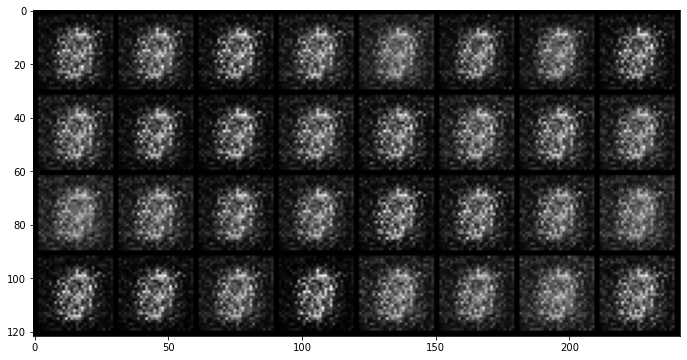



Epoch [2/50]:	loss_disc=1.3860	loss_gen=0.7689


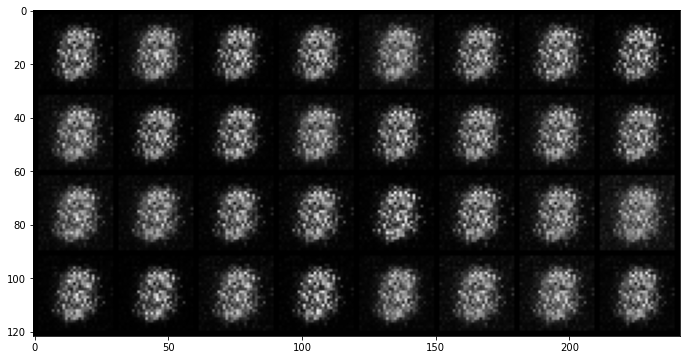



Epoch [3/50]:	loss_disc=0.7081	loss_gen=1.3050


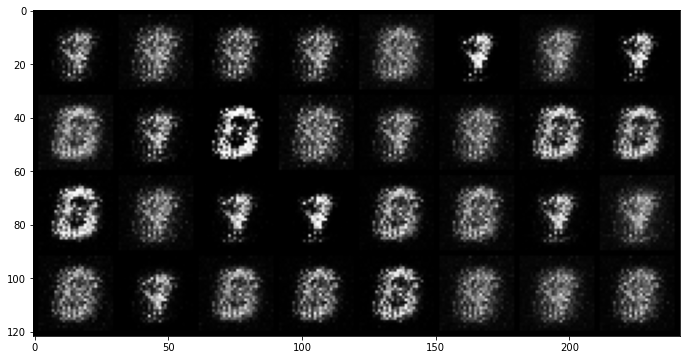



Epoch [4/50]:	loss_disc=1.3986	loss_gen=0.9356


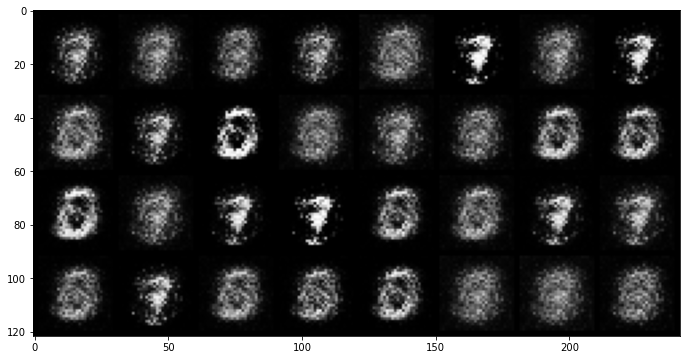



Epoch [5/50]:	loss_disc=0.9608	loss_gen=1.1255


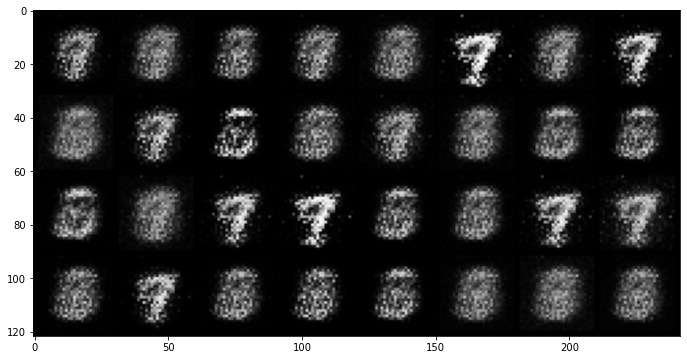



Epoch [6/50]:	loss_disc=1.3045	loss_gen=0.9917


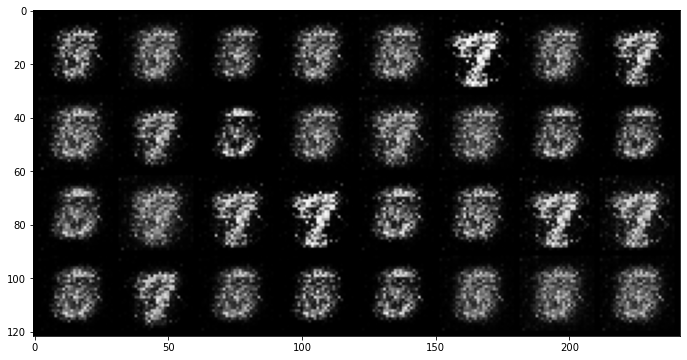



Epoch [7/50]:	loss_disc=1.4607	loss_gen=0.8103


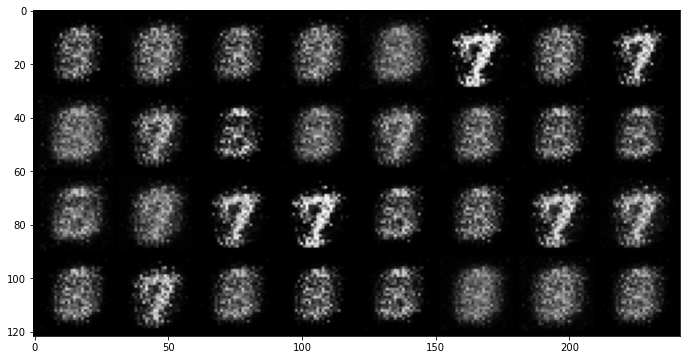



Epoch [8/50]:	loss_disc=1.0689	loss_gen=1.0454


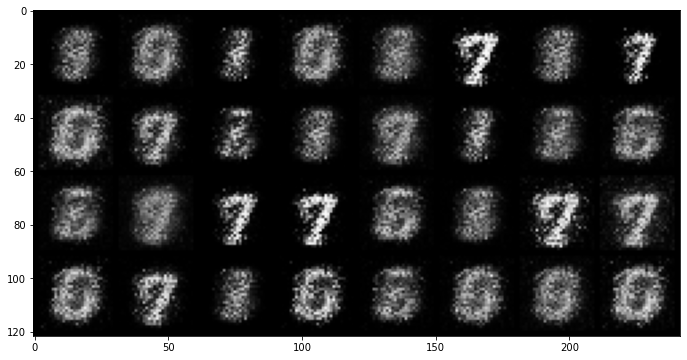



Epoch [9/50]:	loss_disc=1.3594	loss_gen=0.9944


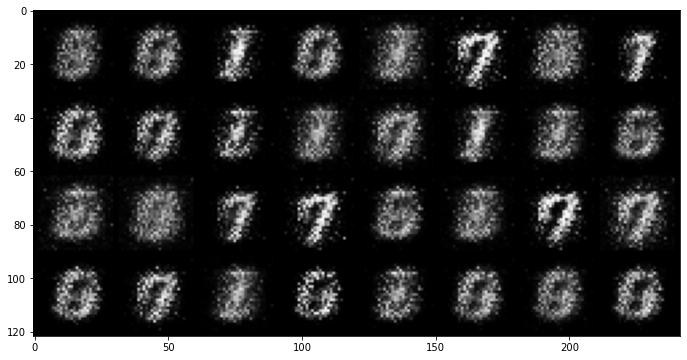



Epoch [10/50]:	loss_disc=1.2890	loss_gen=0.9170


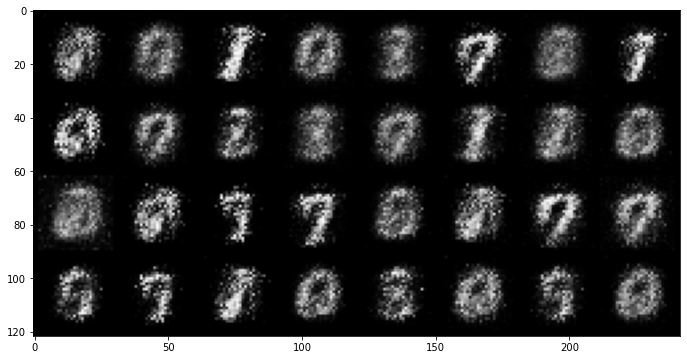



Epoch [11/50]:	loss_disc=1.4415	loss_gen=1.3205


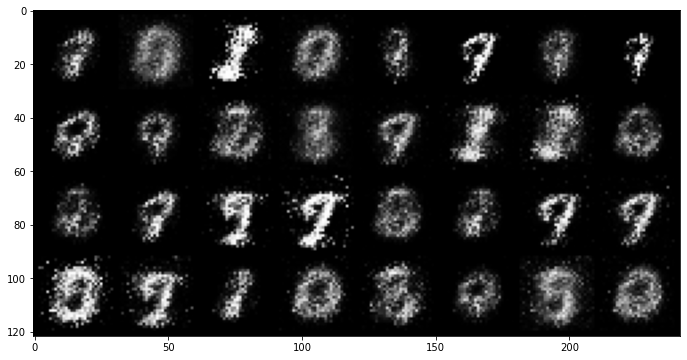



Epoch [12/50]:	loss_disc=1.2250	loss_gen=1.0619


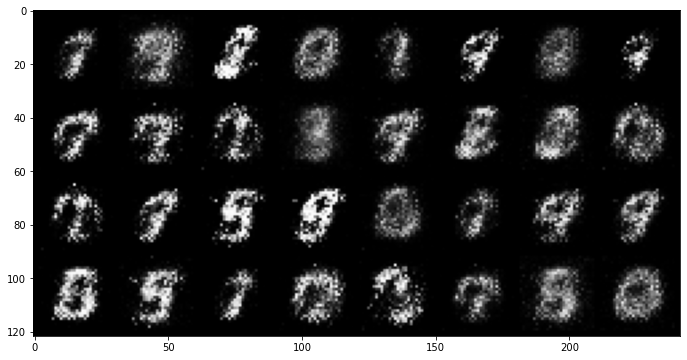



Epoch [13/50]:	loss_disc=1.2808	loss_gen=1.1125


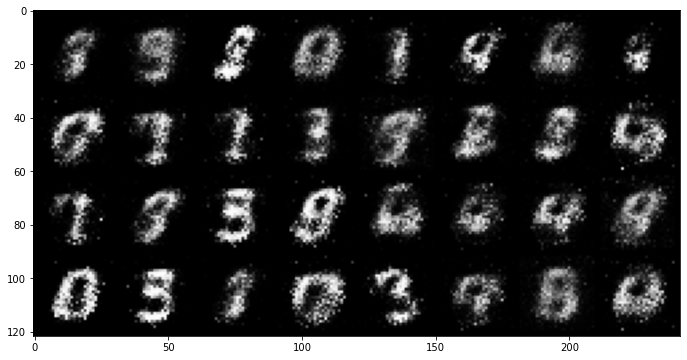



Epoch [14/50]:	loss_disc=1.6935	loss_gen=0.8476


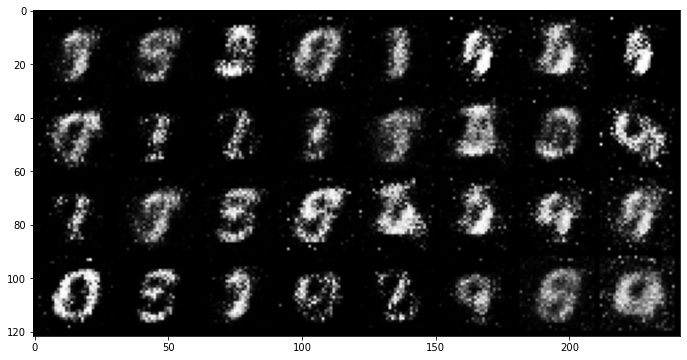



Epoch [15/50]:	loss_disc=1.1653	loss_gen=1.1126


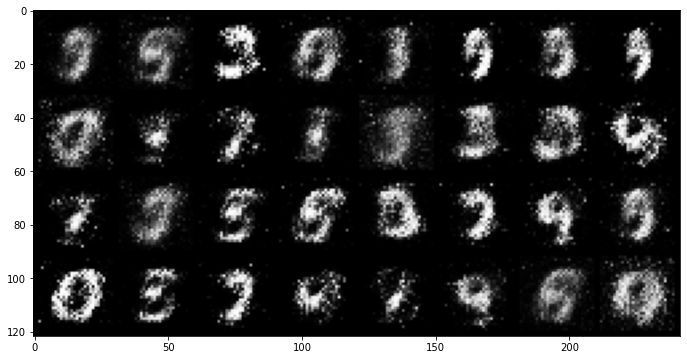



Epoch [16/50]:	loss_disc=0.9843	loss_gen=1.3928


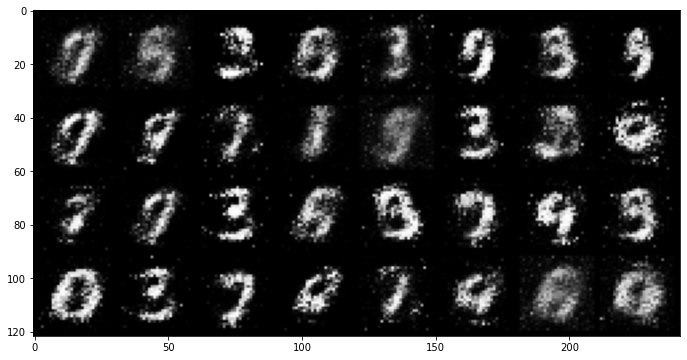



Epoch [17/50]:	loss_disc=0.9705	loss_gen=1.3089


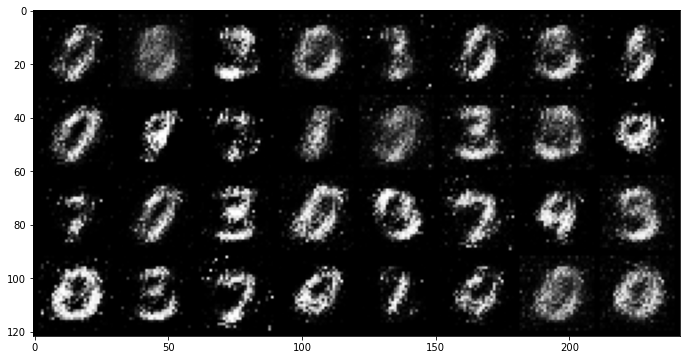



Epoch [18/50]:	loss_disc=1.4822	loss_gen=1.0324


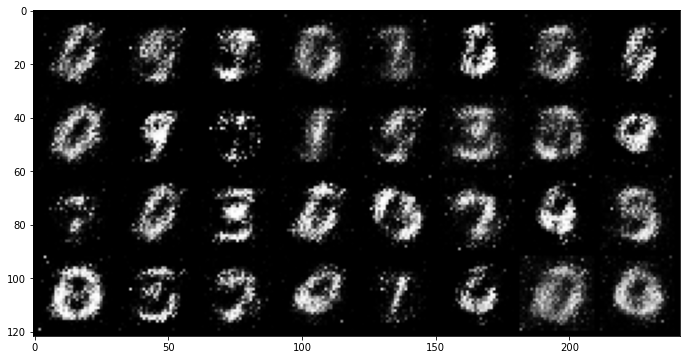



Epoch [19/50]:	loss_disc=0.9000	loss_gen=1.3419


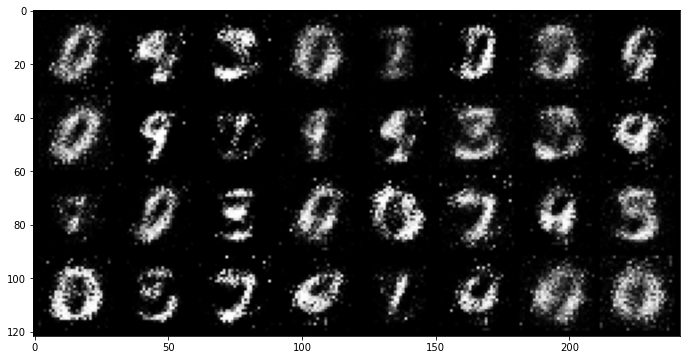



Epoch [20/50]:	loss_disc=1.3238	loss_gen=0.8907


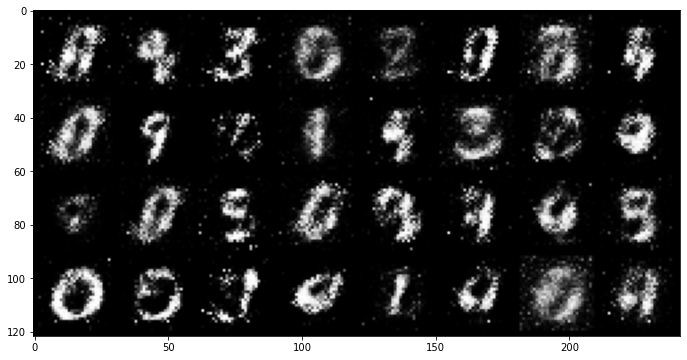



Epoch [21/50]:	loss_disc=1.0467	loss_gen=1.0484


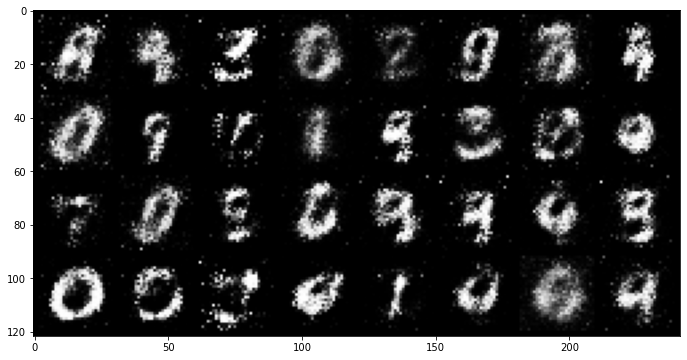



Epoch [22/50]:	loss_disc=1.5846	loss_gen=0.8737


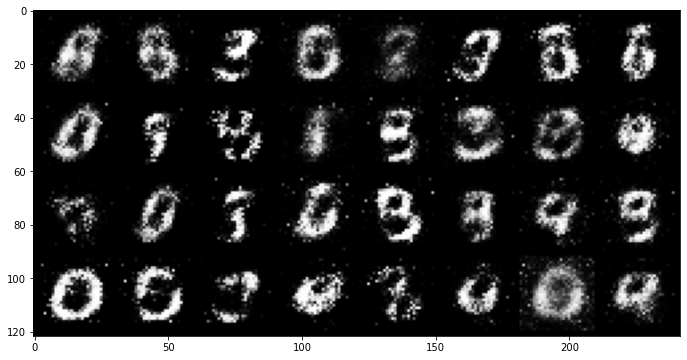



Epoch [23/50]:	loss_disc=1.1760	loss_gen=1.3757


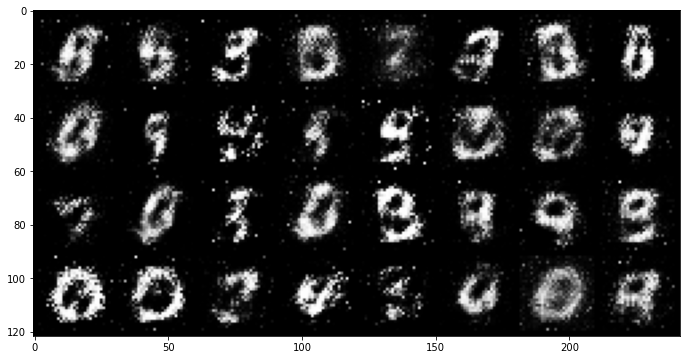



Epoch [24/50]:	loss_disc=1.4729	loss_gen=0.6771


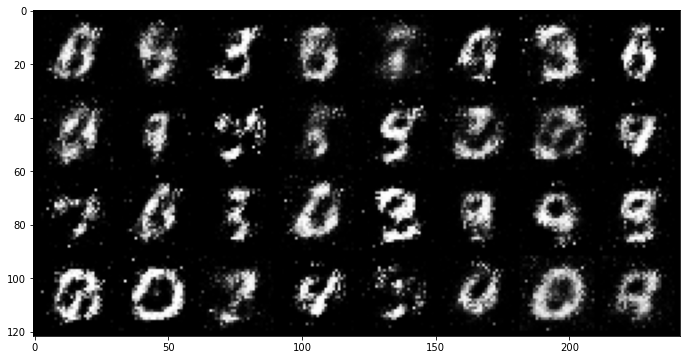



Epoch [25/50]:	loss_disc=1.0374	loss_gen=1.3166


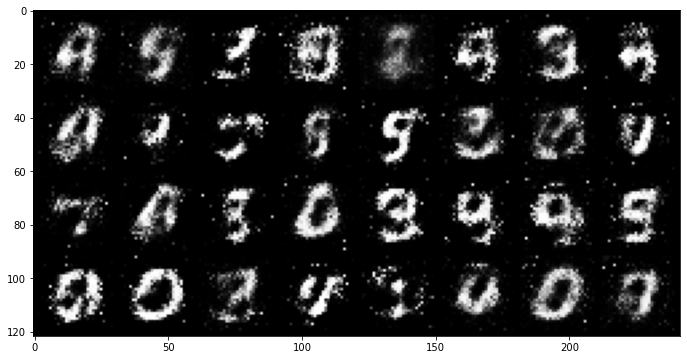



Epoch [26/50]:	loss_disc=1.2953	loss_gen=1.1186


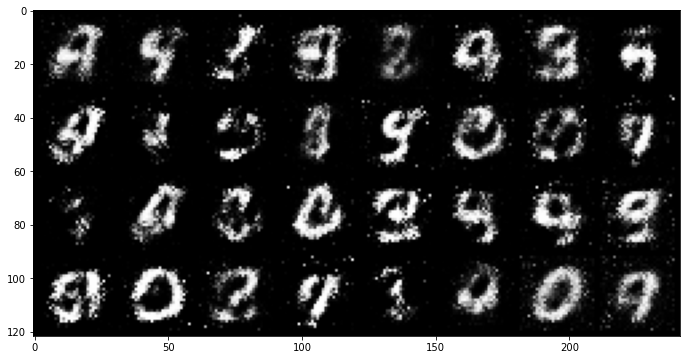



Epoch [27/50]:	loss_disc=1.1527	loss_gen=1.0787


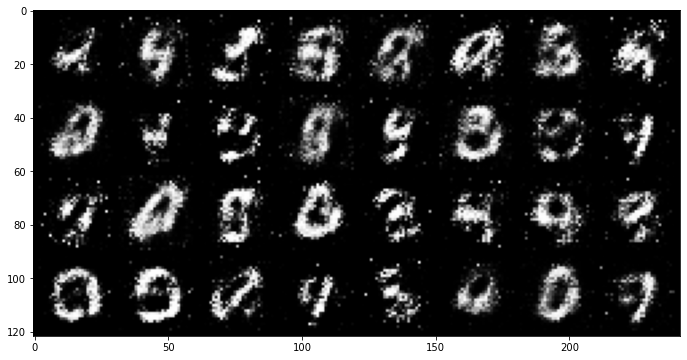



Epoch [28/50]:	loss_disc=1.2336	loss_gen=1.1867


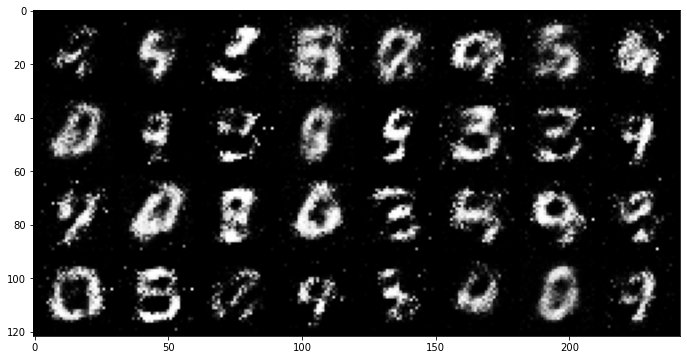



Epoch [29/50]:	loss_disc=1.2190	loss_gen=0.9847


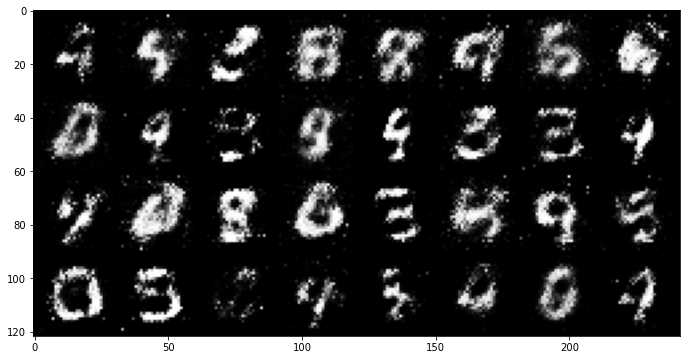



Epoch [30/50]:	loss_disc=1.5560	loss_gen=0.7600


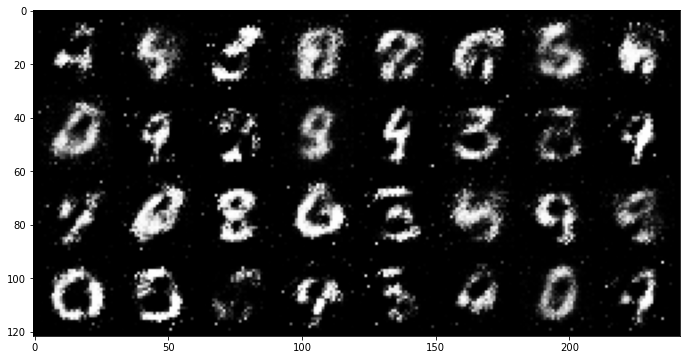



Epoch [31/50]:	loss_disc=1.4470	loss_gen=1.0599


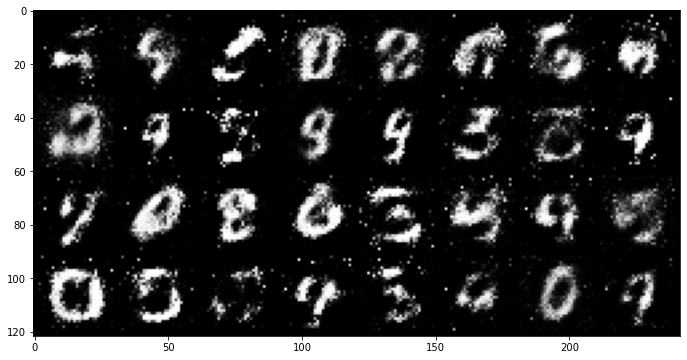



Epoch [32/50]:	loss_disc=1.2998	loss_gen=0.7188


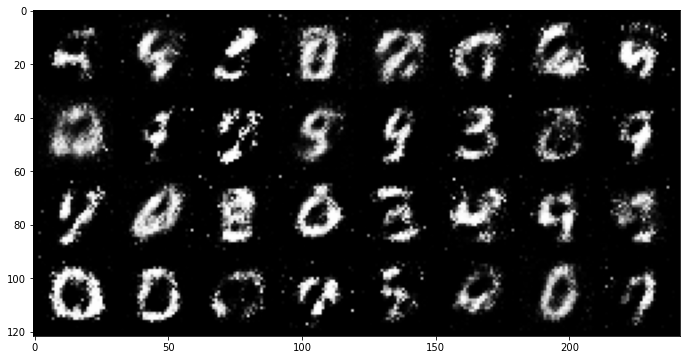



Epoch [33/50]:	loss_disc=1.2594	loss_gen=1.2426


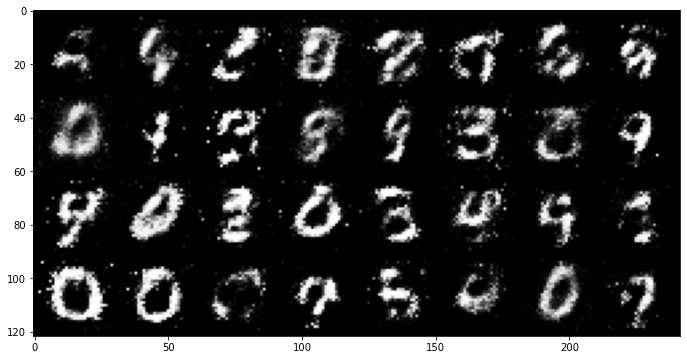



Epoch [34/50]:	loss_disc=1.0142	loss_gen=1.2561


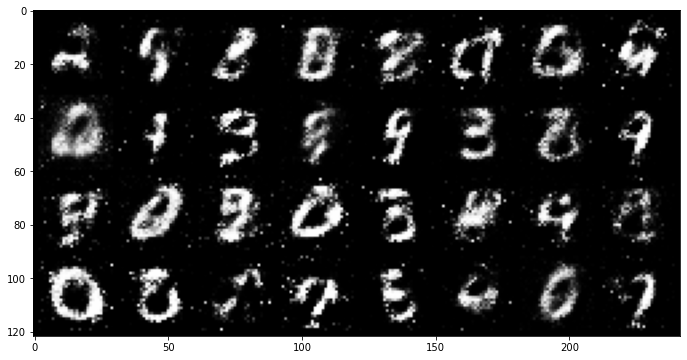



Epoch [35/50]:	loss_disc=1.2486	loss_gen=0.9105


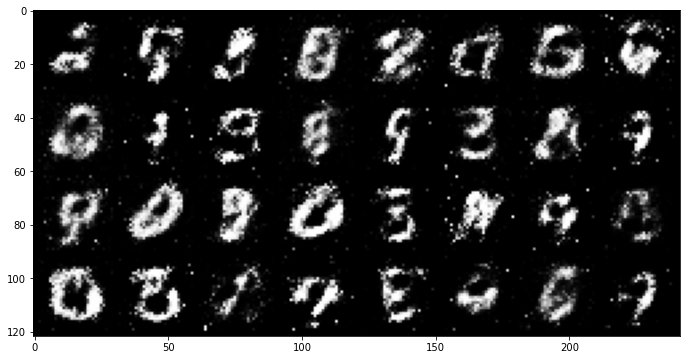



Epoch [36/50]:	loss_disc=1.2541	loss_gen=1.2421


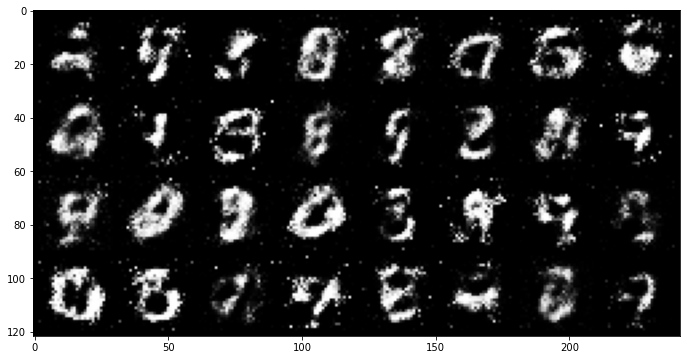



Epoch [37/50]:	loss_disc=1.4094	loss_gen=1.1109


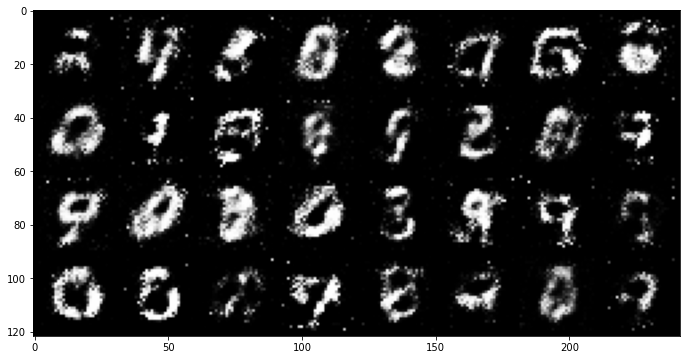



Epoch [38/50]:	loss_disc=1.2066	loss_gen=0.9259


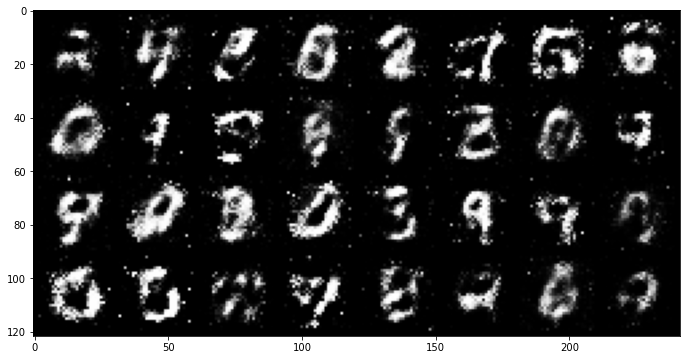



Epoch [39/50]:	loss_disc=1.1351	loss_gen=1.1574


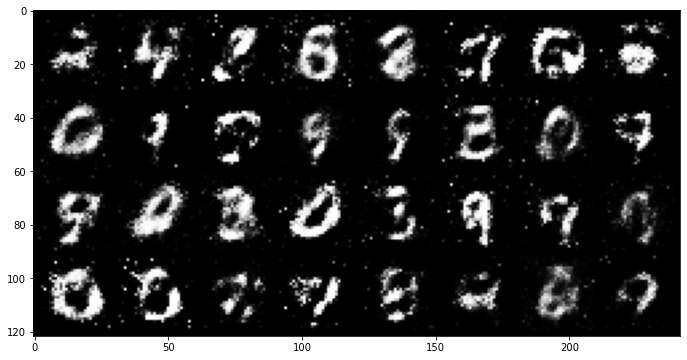



Epoch [40/50]:	loss_disc=1.0098	loss_gen=1.1065


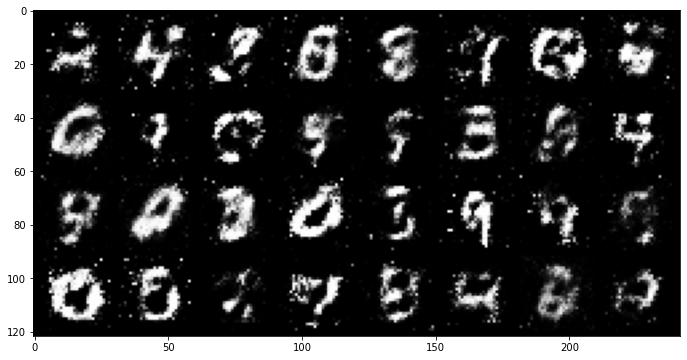



Epoch [41/50]:	loss_disc=1.4638	loss_gen=0.8448


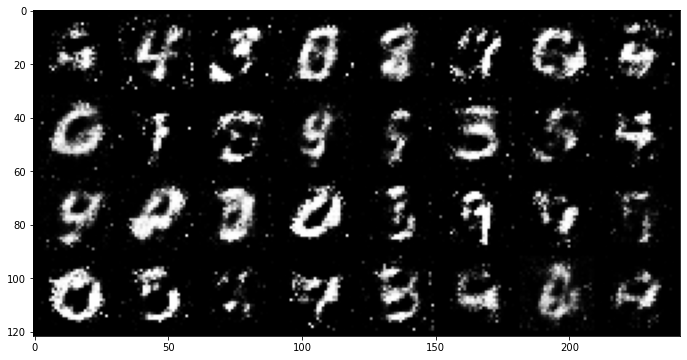



Epoch [42/50]:	loss_disc=1.3165	loss_gen=0.8583


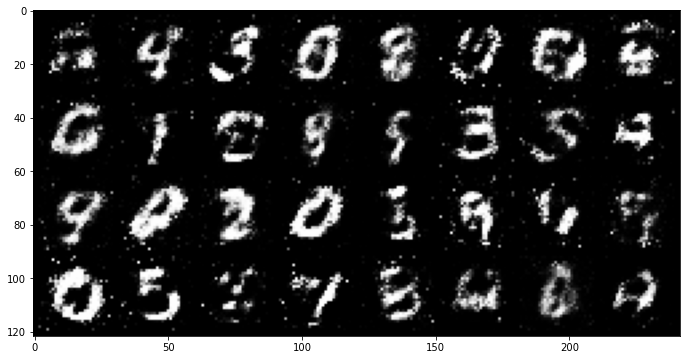



Epoch [43/50]:	loss_disc=1.4514	loss_gen=0.8666


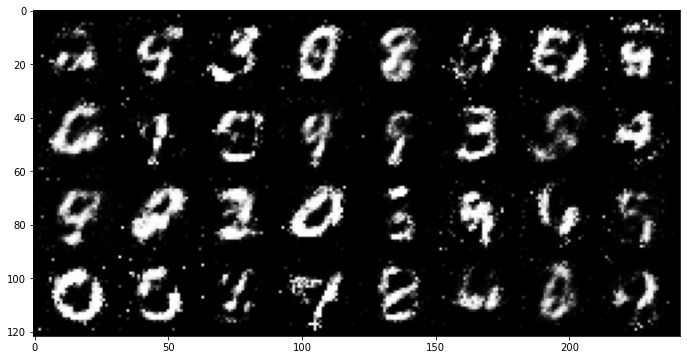



Epoch [44/50]:	loss_disc=0.7294	loss_gen=1.4019


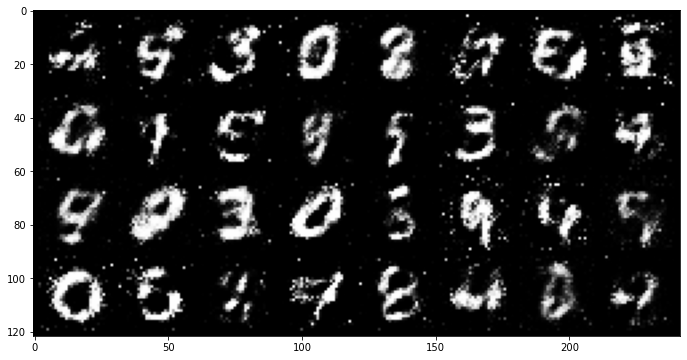



Epoch [45/50]:	loss_disc=1.3156	loss_gen=1.0324


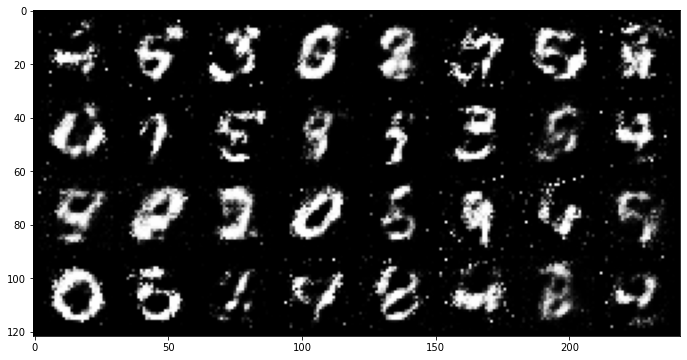



Epoch [46/50]:	loss_disc=1.1854	loss_gen=1.0798


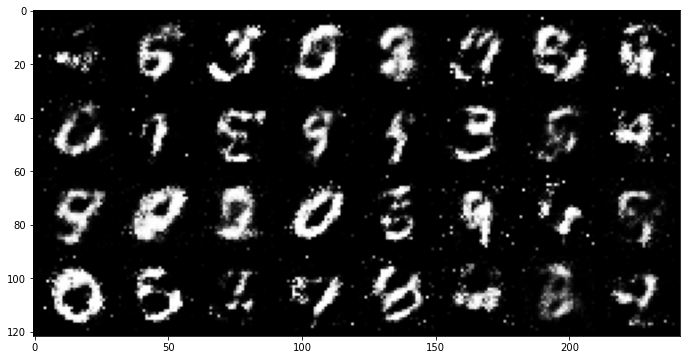



Epoch [47/50]:	loss_disc=1.2623	loss_gen=0.8790


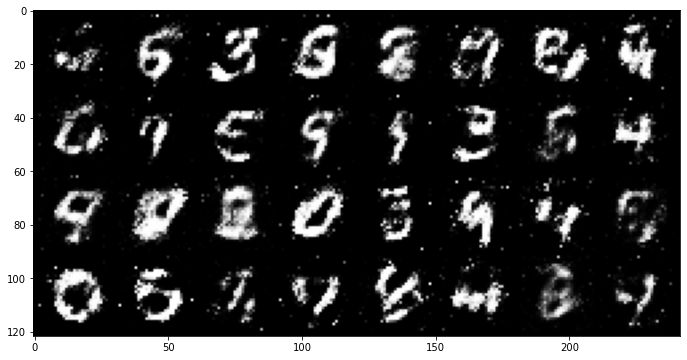



Epoch [48/50]:	loss_disc=1.3146	loss_gen=0.9149


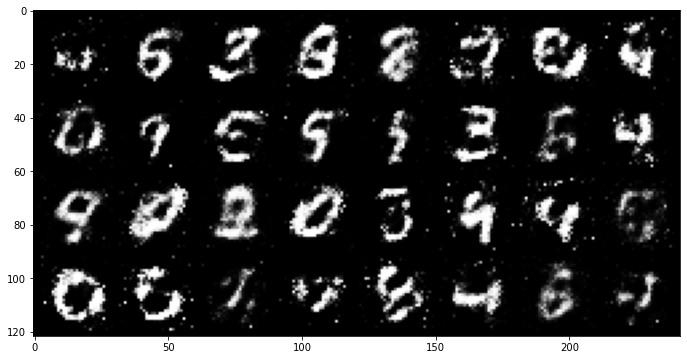



Epoch [49/50]:	loss_disc=1.1994	loss_gen=0.9557


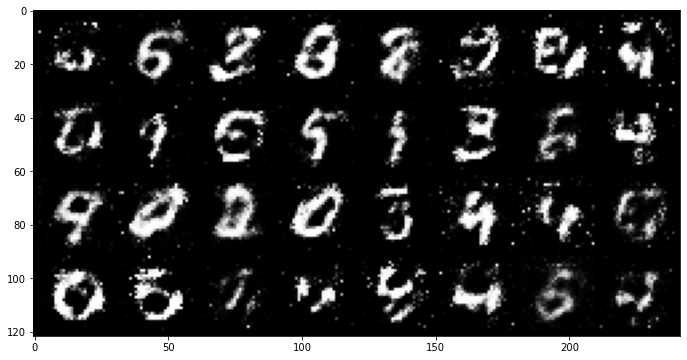



Epoch [50/50]:	loss_disc=1.3121	loss_gen=0.8997


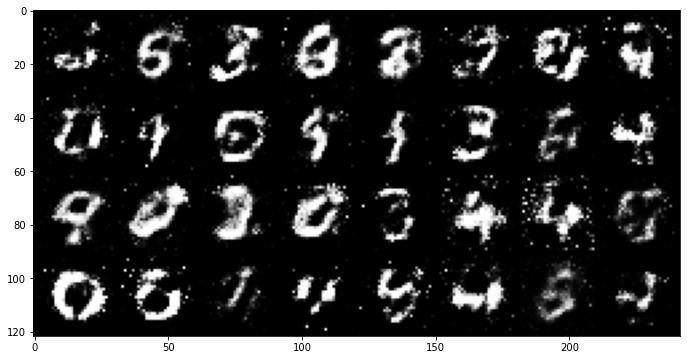

In [5]:
for epoch in range(NUM_EPOCHS):
    for batch_idx, (real, _) in enumerate(loader):
        real = real.view(-1, 784)
        batch_size = real.shape[0]
        
        ### ----------- TRAIN DISCRIMINATOR ------------ ###
        # min(-[log(D(z)) + log(1-D(G(z)))])
        
        noise = torch.randn((batch_size, Z_DIM))
        fake = gen.forward(noise)
        
        # Output of the discriminator on the real data
        disc_real = disc.forward(real)
        disc_fake = disc.forward(fake)
        d_real = criterion(disc_real, torch.ones_like(disc_real))
        d_fake = criterion(disc_fake, torch.zeros_like(disc_fake))
        d_loss = d_real + d_fake
        
        disc.zero_grad()
        d_loss.backward(retain_graph=True)
        opt_disc.step()
    
        ### ----------- TRAIN GENERATOR ------------ ###
        # min(-log(1-D(G(z)))]) leads to vanishing gradients -> min(-log(D(G(z))))
        
        output = disc.forward(fake)
        loss_g = criterion(output, torch.ones_like(output))
        gen.zero_grad()
        loss_g.backward()
        opt_gen.step()
    
    print(f'Epoch [{epoch+1}/{NUM_EPOCHS}]:\tloss_disc={d_loss.item():.4f}\tloss_gen={loss_g.item():.4f}')
    fake = gen.forward(fixed_noise).reshape(-1, 1, 28, 28)
    img_grid = torchvision.utils.make_grid(fake, normalize=True)
    plt.figure(figsize=(12, 6))
    plt.imshow(img_grid.permute([1, 2, 0]).detach())
    plt.show()
    print(f'\n')